### Notebook for the integration and label transfer of myeloid immune cells with `scANVI`

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology - Faculty of Medicine - Julius-Maximilian-Universität Würzburg**
- **Created on**: 240329
- **Last modified**: 240402

### Import required modules

In [1]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import plotnine as p
from pywaffle import Waffle
import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                 10.2.0
absl                NA
asttokens           NA
attr                23.2.0
chex                0.1.85
comm                0.2.1
contextlib2         NA
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.8.1
decorator           5.1.1
docrep              0.3.2
etils               1.7.0
executing           2.0.1
flax                0.8.1
fsspec              2024.2.0
h5py                3.10.0
igraph              0.11.4
importlib_resources NA
ipykernel           6.29.2
ipywidgets          8.1.2
jax                 0.4.19
jaxlib              0.4.19
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
lightning           2.1.4
lightning_utilities 0.10.1
llvmlite            0.42.0
matplotlib          3.8.3
mizani              0.11.0
ml_collections      NA
ml_dtypes           0.3.2
mpl_toolkits        NA
msgpack             1.0.7
mudata        

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

### Read in and format individual datasets compartments

- Read in CD45+ immune cells 

In [5]:
MDX_MPC = sc.read_h5ad('../../../data/MDX_MPC.h5ad')
MDX_MPC.obs['genotype'] = MDX_MPC.obs['Condition'].copy()
MDX_MPC.obs['sample'] = MDX_MPC.obs['hash.ID'].copy()
MDX_MPC.obs['donor'] = MDX_MPC.obs['Sample'].copy()
MDX_MPC.obs['seed_labels'] = MDX_MPC.obs['MPC_Annotation'].copy()
MDX_MPC.obs['cell_source'] = 'HIRI-CD45+'
MDX_MPC

AnnData object with n_obs × n_vars = 6305 × 31053
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Library', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5', 'MPC_Annotation', 'genotype', 'sample', 'donor', 'seed_labels', 'cell_source'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

In [6]:
MDX_MPC.obs['sample'].value_counts()

sample
Hashtag9-TotalA     576
Hashtag10-TotalA    497
Hashtag5-TotalA     488
Hashtag3-TotalA     475
Hashtag2-TotalA     464
Hashtag4-TotalA     432
Hashtag1-TotalA     427
Hashtag7-TotalA     427
Hashtag12-TotalA    416
Hashtag11-TotalA    414
Hashtag14-TotalA    387
Hashtag6-TotalA     363
Hashtag8-TotalA     359
Hashtag15-TotalA    324
Hashtag13-TotalA    256
Name: count, dtype: int64

In [7]:
MDX_MPC = MDX_MPC[MDX_MPC.obs['nFeature_RNA'] > 200]
MDX_MPC = MDX_MPC[MDX_MPC.obs['nFeature_RNA'] < 4000]

MDX_MPC = MDX_MPC[MDX_MPC.obs['nCount_RNA'] < 15000]
MDX_MPC = MDX_MPC[MDX_MPC.obs['nCount_RNA'] > 200]

MDX_MPC = MDX_MPC[MDX_MPC.obs['percent.mt'] < 60]

MDX_MPC

View of AnnData object with n_obs × n_vars = 5451 × 31053
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Library', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5', 'MPC_Annotation', 'genotype', 'sample', 'donor', 'seed_labels', 'cell_source'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

In [8]:
MDX_POOL_NEW = sc.read_h5ad('../../../data/MDX_POOL_NEW.h5ad')
MDX_POOL_NEW.obs['genotype'] = MDX_POOL_NEW.obs['Condition'].copy()
MDX_POOL_NEW.obs['sample'] = MDX_POOL_NEW.obs['hash.ID'].copy()
MDX_POOL_NEW.obs['donor'] = MDX_POOL_NEW.obs['Sample'].copy()
MDX_POOL_NEW.obs['seed_labels'] = MDX_POOL_NEW.obs['CD45_Annotation'].copy()
MDX_POOL_NEW.obs['cell_source'] = 'HIRI-CD45+'
MDX_POOL_NEW

AnnData object with n_obs × n_vars = 11098 × 31053
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Library', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'CD45_Annotation', 'genotype', 'sample', 'donor', 'seed_labels', 'cell_source'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

In [9]:
MDX_POOL_NEW = MDX_POOL_NEW[MDX_POOL_NEW.obs['nFeature_RNA'] > 200]
MDX_POOL_NEW = MDX_POOL_NEW[MDX_POOL_NEW.obs['nFeature_RNA'] < 4000]

MDX_POOL_NEW = MDX_POOL_NEW[MDX_POOL_NEW.obs['nCount_RNA'] < 15000]
MDX_POOL_NEW = MDX_POOL_NEW[MDX_POOL_NEW.obs['nCount_RNA'] > 200]

MDX_POOL_NEW = MDX_POOL_NEW[MDX_POOL_NEW.obs['percent.mt'] < 60]

MDX_POOL_NEW

View of AnnData object with n_obs × n_vars = 10114 × 31053
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Library', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'CD45_Annotation', 'genotype', 'sample', 'donor', 'seed_labels', 'cell_source'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

- Read in Meyer annotated PBMC cells

In [10]:
pbmc = sc.read_h5ad('../../../data/meyer_nikolic_healthy_pbmc_raw.h5ad') 
pbmc

AnnData object with n_obs × n_vars = 173684 × 33559
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states'
    var: 'name'

In [11]:
pbmc_healthy = pbmc[pbmc.obs['COVID_status'].isin(['Healthy'])]
pbmc_healthy.obs['sample'] = pbmc_healthy.obs['sample_id'].copy()
pbmc_healthy.obs['seed_labels'] = pbmc_healthy.obs['annotation_detailed'].copy()
pbmc_healthy.obs['cell_source'] = 'Sanger-Cells'
pbmc_healthy.obs['genotype'] = 'human'
pbmc_healthy

AnnData object with n_obs × n_vars = 173684 × 33559
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype'
    var: 'name'

In [12]:
pbmc_healthy.var_names = [gene_name.capitalize() for gene_name in pbmc_healthy.var_names]
pbmc_healthy.var_names

Index(['Mir1302-2hg', 'Fam138a', 'Or4f5', 'Al627309.1', 'Al627309.3',
       'Al627309.2', 'Al627309.4', 'Al732372.1', 'Or4f29', 'Ac114498.1',
       ...
       'Viral-hhv-6a-(human-herpes-virus-6)',
       'Viral-hhv-6b-(human-herpes-virus-6)',
       'Viral-herpes-simplex-virus-1-(human-alphaherpesvirus-1)',
       'Viral-herpes-simplex-virus-2-(human-alphaherpesvirus-1)',
       'Viral-measles-morbillivirus', 'Viral-mumps-rubulavirus',
       'Viral-rubella',
       'Viral-varicella-zoster-virus-(vzv-human-alphaherpesvirus-3)',
       'Viral-cytomegalovieus-(cmv)', 'Viral-sars-cov2'],
      dtype='object', length=33559)

### Read in DMD query cells

In [13]:
DMD_scANVI = sc.read_h5ad('../../../data/heart_mm_nuclei-23-0092_scANVI-Immune_ctl240329.raw.h5ad')
DMD_scANVI

AnnData object with n_obs × n_vars = 81644 × 27478
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'C_scANVI_new'
    var: 'gene_ids-DMD_immune', 'feature_types-DMD_immune', 'genome-DMD_immune', 'mt-DMD_immune', 'ribo-DMD_immune', 'n_cells_by_counts-DMD_immune', 'mean_counts-DMD_immune', 'pct_dropout_by_counts-DMD_immune', 'total_counts-DMD_immune', 'vst.m

In [14]:
DMD_scANVI.obs['C_scANVI_new'].cat.categories

Index(['B_cells', 'B_mem', 'B_naive', 'Baso/Eos', 'CD4+T', 'CD4+Tnaive',
       'CD8+T', 'CD8+Tcm', 'CD8+Tem', 'CD8+Temra', 'CD8+Tnaive', 'CD14+Mo',
       'CD16+Mo', 'CD56+NK', 'Ccr2+MHCII+MØ', 'DC', 'ILC', 'Isg15+MØ',
       'Ly6ChiMo', 'Ly6CloMo', 'MHCII+MØtr', 'Mast', 'MØinf', 'NK', 'NKT',
       'Neutrophils', 'Plasma', 'Platelets', 'TLF+MØ', 'Th', 'Treg', 'gdT',
       'pDC'],
      dtype='object')

In [15]:
DMD_myeloid = DMD_scANVI[DMD_scANVI.obs['C_scANVI_new'].isin(['Baso/Eos', 'CD14+Mo', 'CD16+Mo', 'CD56+NK', 'Ccr2+MHCII+MØ', 'DC', 'ILC', 'Isg15+MØ', 'Ly6ChiMo', 'Ly6CloMo', 'MHCII+MØtr', 'Mast', 'MØinf', 'NK', 'NKT', 'Neutrophils', 'Platelets', 'TLF+MØ', 'gdT', 'pDC'])]
DMD_myeloid.obs['seed_labels'] = 'Unknown'
del(DMD_myeloid.obs['C_scANVI_new'])
DMD_myeloid

AnnData object with n_obs × n_vars = 30175 × 27478
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune', 'feature_types-DMD_immune', 'genome-DMD_immune', 'mt-DMD_immune', 'ribo-DMD_immune', 'n_cells_by_counts-DMD_immune', 'mean_counts-DMD_immune', 'pct_dropout_by_counts-DMD_immune', 'total_counts-DMD_immune', 'vst.mean-MDX_MPC', 'v

### Merge cell compartments and compare with full object

In [16]:
compartments = pbmc_healthy.concatenate(DMD_myeloid, MDX_POOL_NEW, MDX_MPC,  
                                      batch_key = 'compartment', 
                                      batch_categories = ['pbmc_meyer', 'DMD', 'MDX_POOL_NEW', 'MDX_MPC'], 
                                      join = 'inner')
compartments

AnnData object with n_obs × n_vars = 219424 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'nCount_RNA', 'nFeature_RNA', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5'
    var: 'gene_ids-DMD_immune-DM

In [17]:
compartments.obs_names

Index(['CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAAGTAG-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAGATGA-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCATTTGGG-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCCGAAGAG-1-pbmc_meyer',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCTGCTTGC-1-pbmc_meyer',
       ...
       'TTTGGAGAGACTAAGT-1_2-MDX_MPC', 'TTTGGAGAGCGACTGA-1_2-MDX_MPC',
       'TTTGGAGAGGATAATC-1_2-MDX_MPC', 'TTTGGAGAGTAGGATT-1_2-MDX_MPC',
       'TTTGGAGTCTCGGCTT-1_2-MDX_MPC', 'TTTGGTTTCCATAGAC-1_2-MDX_MPC',
       'TTTGTTGAGATTCGAA-1_2-MDX_MPC

In [18]:
adata_export_raw = DMD_myeloid.concatenate(MDX_POOL_NEW, MDX_MPC,  
                                      batch_key = 'data_sourcecompartment', 
                                      batch_categories = ['DMD', 'MDX_POOL_NEW', 'MDX_MPC'], 
                                      join = 'inner')
adata_export_raw

AnnData object with n_obs × n_vars = 45740 × 27478
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'nCount_RNA', 'nFeature_RNA', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5', 'data_sourcecompartment'
    var

In [19]:
adata_export_raw.obs_names

Index(['AAACCCAGTCAAGCGA-1_1-MDX_POOL_NEW-DMD',
       'AAACCCAGTGGCTTGC-1_1-MDX_POOL_NEW-DMD',
       'AAACGCTGTAGTTACC-1_1-MDX_POOL_NEW-DMD',
       'AAAGGATGTTATCTGG-1_1-MDX_POOL_NEW-DMD',
       'AAAGGATTCGTAGTCA-1_1-MDX_POOL_NEW-DMD',
       'AAAGGGCTCTAACACG-1_1-MDX_POOL_NEW-DMD',
       'AAAGGTATCTATTCGT-1_1-MDX_POOL_NEW-DMD',
       'AAAGTCCGTGGACCAA-1_1-MDX_POOL_NEW-DMD',
       'AAAGTCCTCAGTCATG-1_1-MDX_POOL_NEW-DMD',
       'AAAGTGAAGCGACAGT-1_1-MDX_POOL_NEW-DMD',
       ...
       'TTTGGAGAGACTAAGT-1_2-MDX_MPC', 'TTTGGAGAGCGACTGA-1_2-MDX_MPC',
       'TTTGGAGAGGATAATC-1_2-MDX_MPC', 'TTTGGAGAGTAGGATT-1_2-MDX_MPC',
       'TTTGGAGTCTCGGCTT-1_2-MDX_MPC', 'TTTGGTTTCCATAGAC-1_2-MDX_MPC',
       'TTTGTTGAGATTCGAA-1_2-MDX_MPC', 'TTTGTTGAGTGTTGTC-1_2-MDX_MPC',
       'TTTGTTGCAGGCCCTA-1_2-MDX_MPC', 'TTTGTTGGTGATATAG-1_2-MDX_MPC'],
      dtype='object', length=45740)

### Group fine grained annotations into coarse groups

In [20]:
compartments.obs['seed_labels'] = compartments.obs['seed_labels'].astype('category')
compartments.obs['seed_labels'].cat.categories

Index(['AS-DC', 'A_Res_Mac_MHCII', 'B invar', 'B n-sw mem',
       'B n-sw mem IFN stim', 'B naive', 'B naive IFN stim', 'B sw mem',
       'B_Cells', 'B_TLF_Mac', 'Baso/Eos', 'C_Ccr2+MHCII+_Mac',
       'Conventional_T', 'Cycling', 'D_Inflammatory_Mac', 'E_Isg15+',
       'F_Spp1+Gpnmb+', 'G_Ly6Chi_Mo', 'HPC', 'HPC IFN stim', 'H_Ly6Clow_Mo',
       'ILC', 'ILC2', 'I_cDC2', 'J_Mature_DC', 'K_nd1', 'L_nd2', 'Ly6Chi_Mono',
       'Ly6Clo_Mono', 'MAIT', 'M_low_quality', 'Macrophages', 'Mast/Baso',
       'Monocyte CD14', 'Monocyte CD14 IFN stim', 'Monocyte CD14 IL6',
       'Monocyte CD16', 'Monocyte CD16 IFN stim', 'Monocyte CD16+C1', 'NK',
       'NK CD56', 'NK IFN stim', 'NKT', 'Neutrophils', 'Plasma cells',
       'Plasmablasts', 'Platelets', 'Proliferating', 'RBC', 'T CD4 CTL',
       'T CD4 helper', 'T CD4 naive', 'T CD4 naive IFN stim', 'T CD8 CM',
       'T CD8 CTL', 'T CD8 CTL IFN stim', 'T CD8 EM', 'T CD8 EMRA',
       'T CD8 naive', 'T g/d', 'T reg', 'Unknown', 'cDC1', 'cDC2', 

### Remove low quality or irrelevant labels

In [21]:
compartments_clean = compartments[compartments.obs['seed_labels'].isin(['AS-DC', 'A_Res_Mac_MHCII', 'B_TLF_Mac', 'Baso/Eos', 'C_Ccr2+MHCII+_Mac',
       'D_Inflammatory_Mac', 'E_Isg15+', 'F_Spp1+Gpnmb+', 'G_Ly6Chi_Mo', 'HPC', 'HPC IFN stim', 'H_Ly6Clow_Mo',
       'I_cDC2', 'J_Mature_DC', 'K_nd1', 'L_nd2', 'Ly6Chi_Mono', 'Ly6Clo_Mono', 'Macrophages', 'Mast/Baso',
       'Monocyte CD14', 'Monocyte CD14 IFN stim', 'Monocyte CD14 IL6', 'Monocyte CD16', 'Monocyte CD16 IFN stim', 'Monocyte CD16+C1',
       'Neutrophils', 'Unknown', 'cDC1', 'cDC2'])]
compartments_clean

View of AnnData object with n_obs × n_vars = 72224 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'nCount_RNA', 'nFeature_RNA', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5'
    var: 'gene_ids-DMD_im

### Make uniform annotation for genotype labels

In [22]:
compartments_clean.obs['genotype'].value_counts()

genotype
human       30508
Mdx         10956
WT          10021
MdxSCID      9412
Ctrl         7061
Mdx-SCID     4266
Name: count, dtype: int64

In [23]:
trans_from=['WT', 'Ctrl'],
trans_to = ['WT']

compartments_clean.obs['genotype'] = [str(i) for i in compartments_clean.obs['genotype']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        compartments_clean.obs['genotype'][compartments_clean.obs['genotype'] == leiden_from] = celltype

In [24]:
trans_from=['MdxSCID', 'Mdx-SCID'],
trans_to = ['MdxSCID']

compartments_clean.obs['genotype'] = [str(i) for i in compartments_clean.obs['genotype']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        compartments_clean.obs['genotype'][compartments_clean.obs['genotype'] == leiden_from] = celltype

In [25]:
compartments_clean.obs['genotype'].value_counts()

genotype
human      30508
WT         17082
MdxSCID    13678
Mdx        10956
Name: count, dtype: int64

### Visualise cell type distribution per condition

In [26]:
compartments_clean.obs['seed_labels'].value_counts()

seed_labels
Unknown                   30175
Monocyte CD14             20464
Macrophages                4502
Monocyte CD16              4457
Monocyte CD14 IFN stim     2559
A_Res_Mac_MHCII            1853
cDC2                       1514
D_Inflammatory_Mac         1351
B_TLF_Mac                   871
Neutrophils                 633
Monocyte CD16 IFN stim      616
Monocyte CD16+C1            464
Ly6Chi_Mono                 415
HPC                         414
Ly6Clo_Mono                 391
H_Ly6Clow_Mo                366
G_Ly6Chi_Mo                 318
C_Ccr2+MHCII+_Mac           198
E_Isg15+                    154
K_nd1                       128
I_cDC2                      111
Monocyte CD14 IL6            77
cDC1                         46
Mast/Baso                    39
AS-DC                        28
F_Spp1+Gpnmb+                26
J_Mature_DC                  24
L_nd2                        18
Baso/Eos                     10
HPC IFN stim                  2
Name: count, dtype: int64

### Hamonise cell type labels

In [27]:
compartments_clean.obs['seed_labels'].cat.categories

Index(['AS-DC', 'A_Res_Mac_MHCII', 'B_TLF_Mac', 'Baso/Eos',
       'C_Ccr2+MHCII+_Mac', 'D_Inflammatory_Mac', 'E_Isg15+', 'F_Spp1+Gpnmb+',
       'G_Ly6Chi_Mo', 'HPC', 'HPC IFN stim', 'H_Ly6Clow_Mo', 'I_cDC2',
       'J_Mature_DC', 'K_nd1', 'L_nd2', 'Ly6Chi_Mono', 'Ly6Clo_Mono',
       'Macrophages', 'Mast/Baso', 'Monocyte CD14', 'Monocyte CD14 IFN stim',
       'Monocyte CD14 IL6', 'Monocyte CD16', 'Monocyte CD16 IFN stim',
       'Monocyte CD16+C1', 'Neutrophils', 'Unknown', 'cDC1', 'cDC2'],
      dtype='object')

In [28]:
trans_from = [['pDC'],
              ['AS-DC', 'J_Mature_DC'],
              ['cDC1'],
              ['cDC2', 'I_cDC2'],
              ['Mast/Baso'],
              ['Monocyte CD14', 'Monocyte CD14 IFN stim', 'Monocyte CD14 IL6'],
              ['Monocyte CD16', 'Monocyte CD16 IFN stim', 'Monocyte CD16+C1'],
              ['G_Ly6Chi_Mo', 'Ly6Chi_Mono'],
              ['H_Ly6Clow_Mo', 'Ly6Clo_Mono'],
              ['A_Res_Mac_MHCII'], 
              ['B_TLF_Mac'], 
              ['C_Ccr2+MHCII+_Mac'], 
              ['D_Inflammatory_Mac'], 
              ['E_Isg15+'], 
              ['F_Spp1+Gpnmb+'],
              ['DOCK4+vMØ'],
              ['HPC', 'HPC IFN stim'],
              ['Neutrophils', 'nøMo'],
              ['K_nd1', 'L_nd2', 'Unknown', 'Conventional_T', 'Macrophages', 'MAIT', 'Proliferating', 'gdT', 'T g/d', 'gd_T', 'Cycling', 'Platelets']]

trans_to = ['pDC', 'DC', 'DC1', 'DC2', 'Mast', 'CD14+Mo', 'CD16+Mo', 'Ly6ChiMo', 'Ly6CloMo',  'MHCII+MØtr', 'TLF+MØ', 'Ccr2+MHCII+MØ', 'MØinf', 'Isg15+MØ', 'Spp1+Gpnmb+MØ','DOCK4+MØ', 'HPC', 'NØ', 'Unknown']

compartments_clean.obs['seed_labels'] = [str(i) for i in compartments_clean.obs['seed_labels']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        compartments_clean.obs['seed_labels'][compartments_clean.obs['seed_labels'] == leiden_from] = celltype

- The label 'Macrophages' is very unspecific and takes a lot of cells. To allow for other detailed annotations to be mapped, I will label them as 'Unknown'

In [29]:
compartments_clean.obs['seed_labels'] = compartments_clean.obs['seed_labels'].astype('category')
compartments_clean.obs['seed_labels'].cat.categories

Index(['Baso/Eos', 'CD14+Mo', 'CD16+Mo', 'Ccr2+MHCII+MØ', 'DC', 'DC1', 'DC2',
       'HPC', 'Isg15+MØ', 'Ly6ChiMo', 'Ly6CloMo', 'MHCII+MØtr', 'Mast',
       'MØinf', 'NØ', 'Spp1+Gpnmb+MØ', 'TLF+MØ', 'Unknown'],
      dtype='object')

In [30]:
pd.crosstab(compartments_clean.obs['sample'], compartments_clean.obs['genotype'])

genotype,Mdx,MdxSCID,WT,human
sample,,,,
A9_2,0,0,330,0
A10_2,0,0,9691,0
A11_2,1609,0,0,0
A12_2,1406,0,0,0
AN1,0,0,0,305
AN2,0,0,0,576
AN3,0,0,0,264
AN5,0,0,0,887
AN6,0,0,0,990


### Read in other unannotated dataset and split into groups

In [31]:
compartments_clean.obs['genotype'].value_counts()

genotype
human      30508
WT         17082
MdxSCID    13678
Mdx        10956
Name: count, dtype: int64

In [32]:
reference = compartments_clean[compartments_clean.obs['genotype'].isin(['WT', 'human'])]
reference

View of AnnData object with n_obs × n_vars = 47590 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'nCount_RNA', 'nFeature_RNA', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5'
    var: 'gene_ids-DMD_im

In [33]:
query = compartments_clean[~compartments_clean.obs['genotype'].isin(['WT', 'human'])]
query.obs['seed_labels'] = 'Unknown'
query

AnnData object with n_obs × n_vars = 24634 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'nCount_RNA', 'nFeature_RNA', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5'
    var: 'gene_ids-DMD_immune-DMD

In [34]:
adata = reference.concatenate(query, batch_key = 'batch', batch_categories = ['reference', 'query'], join = 'inner')
adata

AnnData object with n_obs × n_vars = 72224 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'nCount_RNA', 'nFeature_RNA', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5'
    var: 'gene_ids-DMD_immune-DMD

In [35]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs_names

Index(['CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAGATGA-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCTTGCCGT-1',
       'CV001_KM10202384-CV001_KM10202394_AAAGATGAGGCCCGTT-1',
       'CV001_KM10202384-CV001_KM10202394_AAAGATGCAGTTTACG-1',
       'CV001_KM10202384-CV001_KM10202394_AAAGATGGTTGTGGCC-1',
       'CV001_KM10202384-CV001_KM10202394_AAAGCAAAGGGTCTCC-1',
       'CV001_KM10202384-CV001_KM10202394_AAAGCAACACGACTCG-1',
       'CV001_KM10202384-CV001_KM10202394_AAAGCAATCATCACCC-1',
       ...
       'TTTGATCCATAACAGA-1_2-MDX_MPC', 'TTTGATCGTCGTATTG-1_2-MDX_MPC',
       'TTTGATCTCAAGTAAG-1_2-MDX_MPC', 'TTTGGAGAGACTAAGT-1_2-MDX_MPC',
       'TTTGGAGAGCGACTGA-1_2-MDX_MPC', 'TTTGGAGAGGATAATC-1_2-MDX_MPC',
       'TTTGGAGTCTCGGCTT-1_2-MDX_MPC', 'TTTGGTTTCCATAGAC-1_2-MDX_MPC',
       'TTTGTTGAGATTCGAA-1_2-MDX_MPC', 'TTTGTTGGTGATATAG-1_2-MDX_MPC'],
   

- Clean merged object

In [36]:
del(adata.obs['Condition'])
del(adata.obs['hash.ID'])
del(adata.obs['Sample'])
del(adata.obs['HTO_maxID'])
del(adata.obs['HTO_secondID'])
del(adata.obs['HTO_margin'])
del(adata.obs['nCount_RNA'])
del(adata.obs['nFeature_RNA'])
del(adata.obs['nCount_ADT'])
del(adata.obs['nFeature_ADT'])
del(adata.obs['percent.mt'])
del(adata.obs['RNA_snn_res.0.2'])
del(adata.obs['seurat_clusters'])
del(adata.obs['RNA_snn_res.0.3'])
del(adata.obs['RNA_snn_res.0.5'])
adata

AnnData object with n_obs × n_vars = 72224 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD

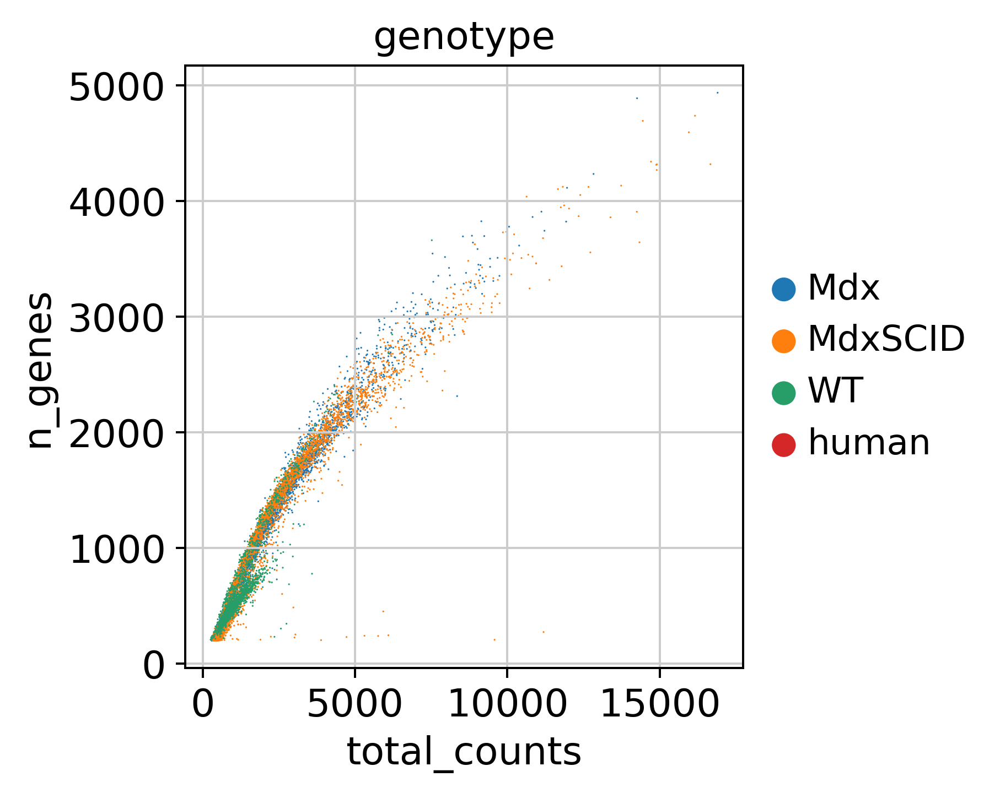

In [37]:
sc.pl.scatter(adata, x = 'total_counts', y = 'n_genes', color = "genotype", frameon = False)

In [38]:
adata.obs['genotype'].value_counts()

genotype
human      30508
WT         17082
MdxSCID    13678
Mdx        10956
Name: count, dtype: int64

In [39]:
adata.obs['sample'].value_counts()

sample
A10_2               9691
B1_2                3407
NP18                3277
NP27                2582
Hashtag9-TotalA     2111
Hashtag2-TotalA     1947
Hashtag5-TotalA     1899
Hashtag1-TotalA     1898
Hashtag4-TotalA     1841
Hashtag3-TotalA     1706
NP17                1658
Hashtag12-TotalA    1654
Hashtag11-TotalA    1627
Hashtag7-TotalA     1627
A11_2               1609
NP19                1572
Hashtag10-TotalA    1570
AN12                1554
Hashtag14-TotalA    1489
A12_2               1406
NP36                1401
Hashtag6-TotalA     1354
NP21                1339
AN13                1334
Hashtag15-TotalA    1299
Hashtag8-TotalA     1279
NP20                1260
NP24                1218
NP37                1200
NP39                1075
Hashtag13-TotalA     992
AN6                  990
B2_2                 980
NP28                 936
AN5                  887
AN7                  858
AN9                  738
NP15                 647
NP41                 581
AN2               

### Select HVGs

In [40]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 2000,
    layer = "counts",
    batch_key = "sample",
    subset = True,
    span = 1
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 72224 × 2000
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD_

### Transfer of annotation with scANVI

In [41]:
scvi.model.SCVI.setup_anndata(adata,
                              batch_key = "sample", 
                            categorical_covariate_keys = ["donor", "cell_source"], 
                            labels_key = "seed_labels", 
                            layer = 'counts')

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [42]:
scvi_model = scvi.model.SCVI(adata, 
                             n_latent = 150, 
                             n_layers = 3, 
                             dispersion = 'gene-batch', 
                             gene_likelihood = 'nb')

In [43]:
scvi_model.train(15, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices = [0])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 15/15: 100%|██████████| 15/15 [00:42<00:00,  2.71s/it, v_num=1, train_loss_step=601, train_loss_epoch=609]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 15/15: 100%|██████████| 15/15 [00:42<00:00,  2.81s/it, v_num=1, train_loss_step=601, train_loss_epoch=609]


In [44]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

### Evaluate model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

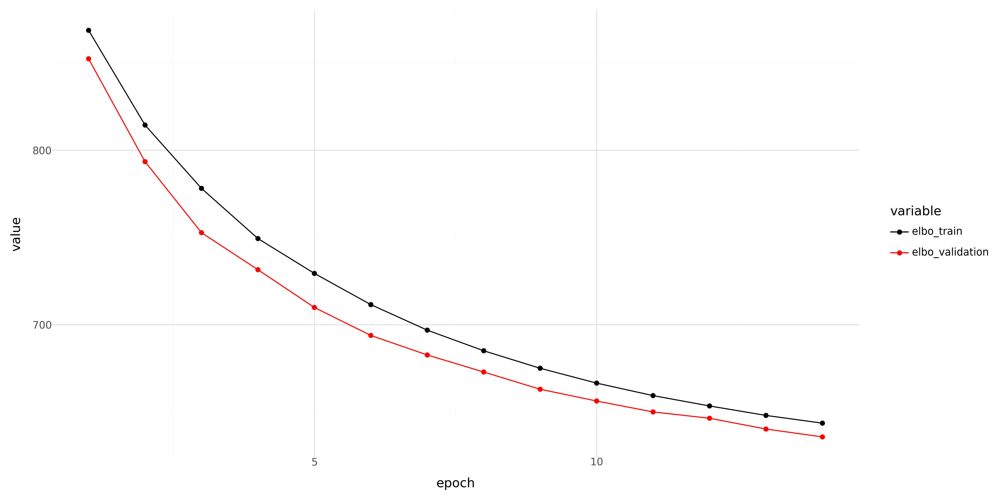

In [45]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Label transfer with `scANVI` 

In [46]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [47]:
scanvi_model.train(10, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices = [0])

INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 10/10: 100%|██████████| 10/10 [01:20<00:00,  7.42s/it, v_num=1, train_loss_step=601, train_loss_epoch=591]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [01:20<00:00,  8.04s/it, v_num=1, train_loss_step=601, train_loss_epoch=591]


In [48]:
adata.obs["C_scANVI_S1"] = scanvi_model.predict(adata)

- Extract latent representation

In [49]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

### Explore model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

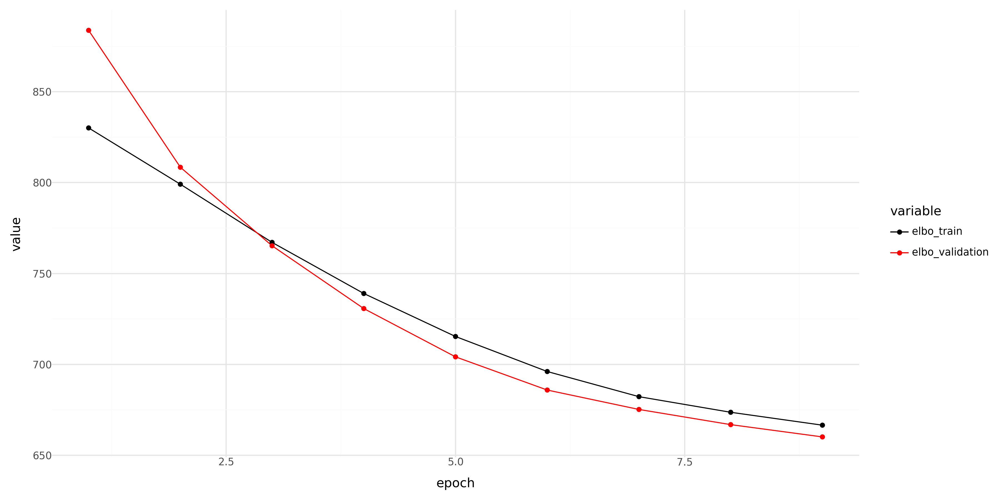

In [50]:
history_df = (
    scanvi_model.history['elbo_train'].astype(float)
    .join(scanvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:35)


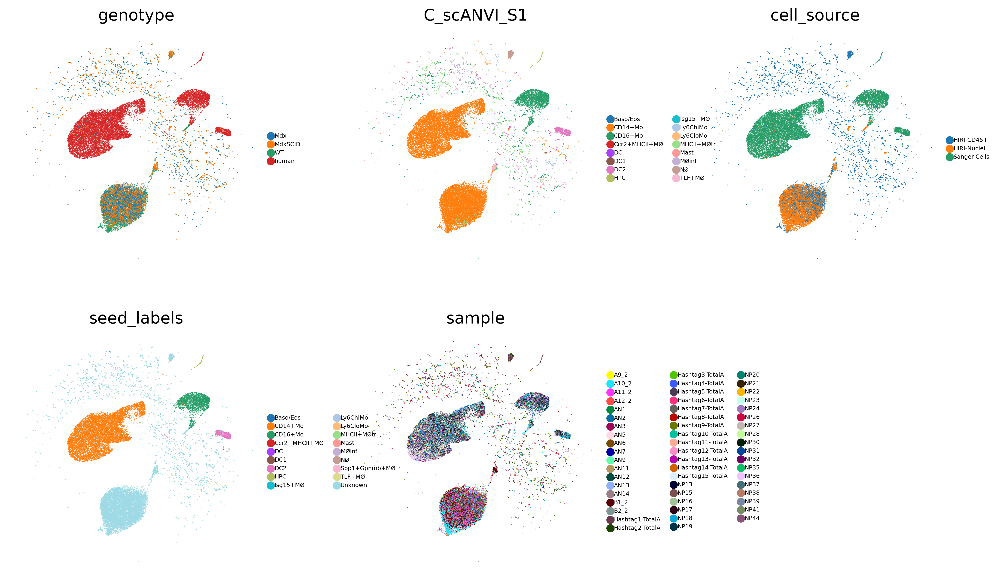

In [51]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 3, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['genotype', 'C_scANVI_S1', 'cell_source', 'seed_labels', 'sample'], size = 0.8, legend_fontsize = 5, ncols = 3)

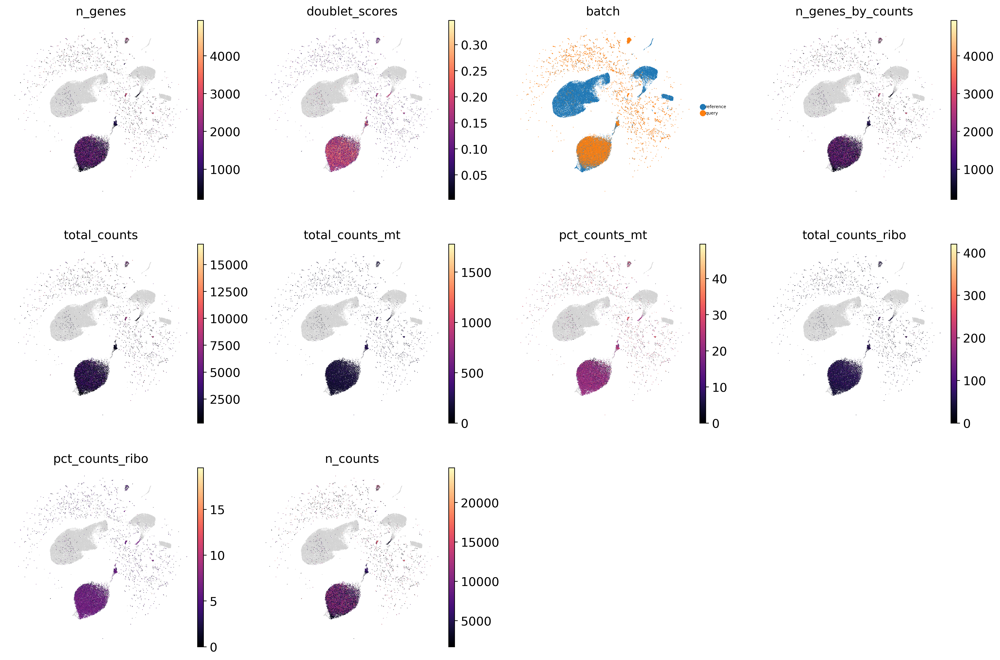

In [52]:
sc.pl.umap(adata, frameon = False, color = ['n_genes', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts'], size = 1, legend_fontsize = 5, ncols = 4, cmap = 'magma')

### Modify object to plot canonical marker genes

In [53]:
adata_toplot = anndata.AnnData(X = np.sqrt(sc.pp.normalize_total(adata_raw, inplace = False)["X"]), var = adata_raw.var, obs = adata.obs, obsm = adata.obsm)
adata_toplot

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 72224 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'C_scANVI_S1'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 't

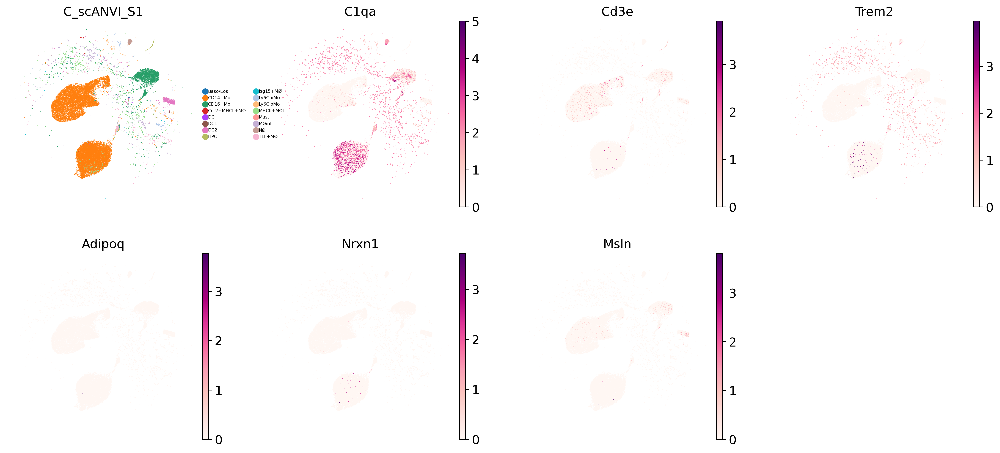

In [54]:
sc.pl.umap(adata_toplot, frameon = False, color = ['C_scANVI_S1', 'C1qa', 'Cd3e', 'Trem2', 'Adipoq', 'Nrxn1', 'Msln'], size = 1, legend_fontsize = 5, ncols = 4, cmap = 'RdPu')

### Visualise proportions

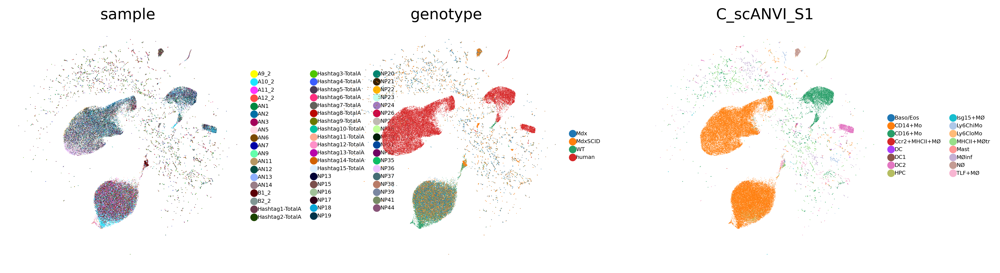

In [55]:
sc.pl.umap(adata, frameon = False, color = ['sample', 'genotype', 'C_scANVI_S1'], size = 0.6, legend_fontsize = 5, ncols = 4)

In [56]:
bauhaus_colors = ['#FF0000', '#FFFF00', '#000000', '#4D5D53', '#0000FF', '#808080']

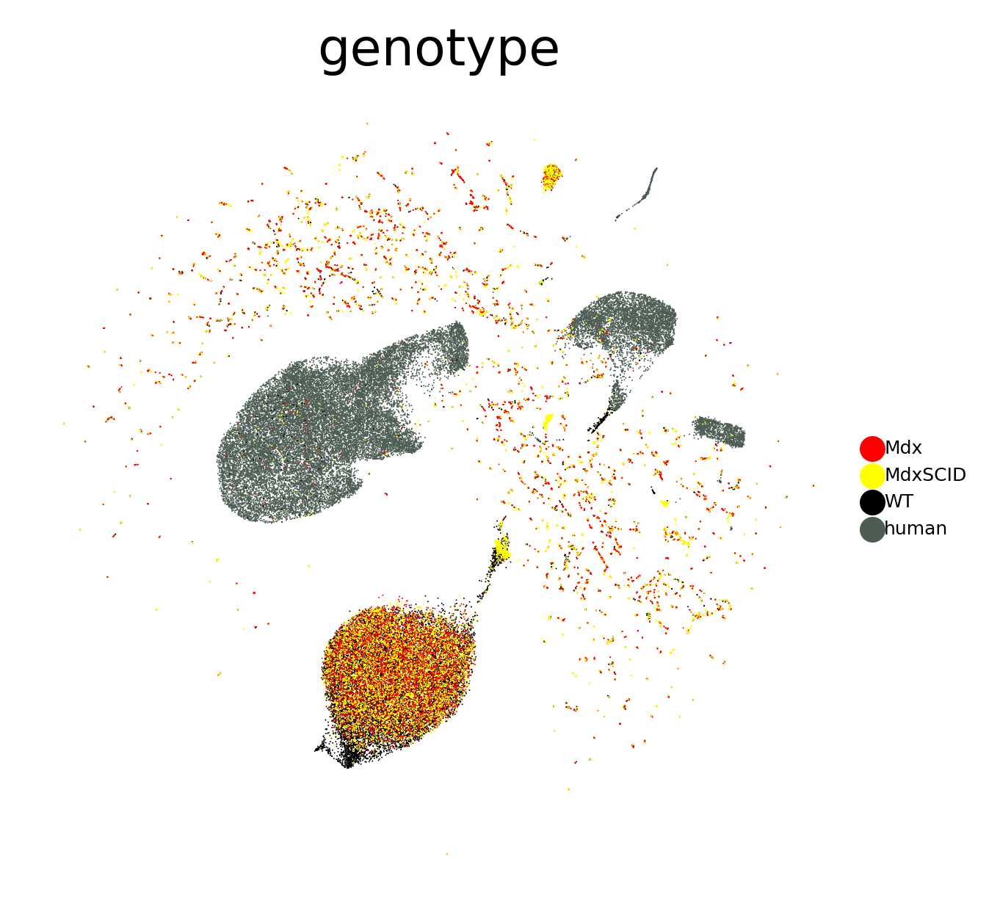

In [57]:
sc.pl.umap(adata, frameon = False, color = ['genotype'], size = 0.6, legend_fontsize = 5, ncols = 4, palette = bauhaus_colors)

In [58]:
df = adata_toplot.obs.groupby(['genotype', 'C_scANVI_S1']).size().reset_index(name = 'counts')

grouped = df.groupby('genotype')['counts'].apply(lambda x: x / x.sum() * 100)
grouped = grouped.reset_index()

df['proportions'] = grouped['counts']
df['waffle_counts'] = (df['proportions'] * 10).astype(int)

In [59]:
def generate_modified_bauhaus_palette(n_colors):
    # Define specific shades
    base_colors = [
        (1, 0, 0),      # Red
        (0.07, 0.04, 0.56),  # Ultramarine blue
        (0, 0.28, 0.67),  # Cobalt blue
        (1, 0.9, 0),  # Bauhaus yellow
        (0, 0, 0),  # Black
        (0.5, 0, 0.5),  # Purple
        (1, 0.55, 0),  # Orange
        (0.54, 0.17, 0.89),  # Violet
    ]

    # Create more distinct variations of each base color
    colors = []
    variation_steps = n_colors // len(base_colors) + 1
    for color in base_colors:
        for i in range(variation_steps):
            # Adjusting brightness and saturation
            variation = tuple(min(max(c * (0.8 + i * 0.1), 0), 1) for c in color)
            colors.append(variation)

    # Ensure we only use the number of colors needed
    unique_colors = []
    for color in colors:
        if color not in unique_colors:
            unique_colors.append(color)
        if len(unique_colors) == n_colors:
            break

    # Shuffle the unique colors
    np.random.shuffle(unique_colors)

    return unique_colors

# Generate the modified palette
bauhaus_palette = generate_modified_bauhaus_palette(18)

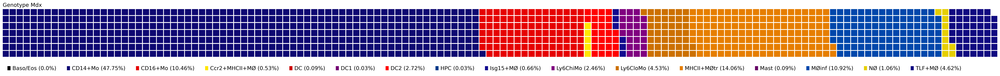

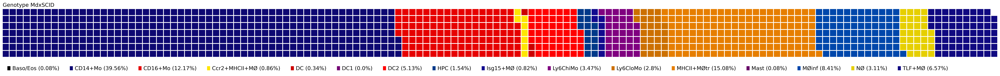

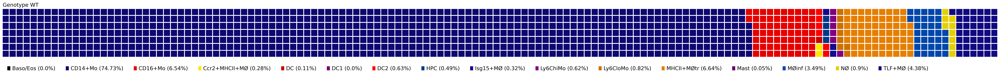

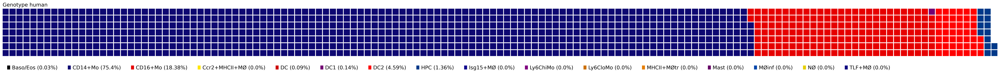

In [60]:
for group in df['genotype'].unique():
    temp_df = df[df['genotype'] == group]
    data = dict(zip(temp_df['C_scANVI_S1'], temp_df['waffle_counts']))

    # Ensure the color list matches the number of cell types
    colors = [bauhaus_palette[i % len(bauhaus_palette)] for i in range(len(temp_df['C_scANVI_S1']))]

    fig = plt.figure(
        FigureClass=Waffle, 
        rows=7, 
        values=data, 
        title={'label': f'Genotype {group}', 'loc': 'left', 'fontsize': 14},
        labels=[f"{k} ({v}%)" for k, v in zip(temp_df['C_scANVI_S1'], temp_df['proportions'].round(2))],
        legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0, 'fontsize': 14},
        figsize=(40, 4),
        colors=colors
    )
    plt.show()

### Prepare object for export

- Fix label for cell annotation

In [61]:
adata.obs['cell_type'] = adata.obs['C_scANVI_S1'].copy()
adata.obs['cell_type'] = adata.obs['cell_type'].astype('category')
adata.obs['cell_type'].cat.categories

Index(['Baso/Eos', 'CD14+Mo', 'CD16+Mo', 'Ccr2+MHCII+MØ', 'DC', 'DC1', 'DC2',
       'HPC', 'Isg15+MØ', 'Ly6ChiMo', 'Ly6CloMo', 'MHCII+MØtr', 'Mast',
       'MØinf', 'NØ', 'TLF+MØ'],
      dtype='object')

In [62]:
adata

AnnData object with n_obs × n_vars = 72224 × 2000
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'C_scANVI_S1'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'to

In [63]:
adata_query = adata[adata.obs['compartment'].isin(['MDX_POOL_NEW', 'DMD', 'MDX_MPC'])]
adata_query

View of AnnData object with n_obs × n_vars = 41716 × 2000
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'C_scANVI_S1'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-D

In [64]:
adata_export = adata_raw[adata_raw.obs['compartment'].isin(['MDX_POOL_NEW', 'DMD', 'MDX_MPC'])]
adata_export.obs['cell_type'] = adata_query.obs['cell_type'].copy()
adata_export

AnnData object with n_obs × n_vars = 41716 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD

In [65]:
pd.crosstab(adata_query.obs['cell_type'], adata_query.obs['genotype'])

genotype,Mdx,MdxSCID,WT
cell_type,,,
Baso/Eos,0,11,0
CD14+Mo,5232,5411,12766
CD16+Mo,1146,1664,1118
Ccr2+MHCII+MØ,58,117,48
DC,10,47,19
DC1,3,0,0
DC2,298,701,107
HPC,3,211,83
Isg15+MØ,72,112,54


In [66]:
pd.crosstab(adata_export.obs['cell_type'], adata_export.obs['genotype'])

genotype,Mdx,MdxSCID,WT
cell_type,,,
Baso/Eos,0,11,0
CD14+Mo,5232,5411,12766
CD16+Mo,1146,1664,1118
Ccr2+MHCII+MØ,58,117,48
DC,10,47,19
DC1,3,0,0
DC2,298,701,107
HPC,3,211,83
Isg15+MØ,72,112,54


### Export annotated object with raw counts

In [67]:
adata_export.obs_names_make_unique()
adata_export

AnnData object with n_obs × n_vars = 41716 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD

In [68]:
adata_export_raw.obs_names_make_unique()
adata_export_raw

AnnData object with n_obs × n_vars = 45740 × 27478
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'nCount_RNA', 'nFeature_RNA', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5', 'data_sourcecompartment'
    var

In [69]:
common_obs_names = adata_export_raw.obs_names[adata_export_raw.obs_names.isin(adata_export.obs_names)]
common_obs_names

Index(['AAACCCAAGTCTTGGT-1_1-MDX_POOL_NEW',
       'AAACCCAGTCAAGCGA-1_1-MDX_POOL_NEW',
       'AAACCCAGTCACTCGG-1_1-MDX_POOL_NEW',
       'AAACCCAGTCATCGCG-1_1-MDX_POOL_NEW',
       'AAACCCAGTGACAGGT-1_1-MDX_POOL_NEW',
       'AAACCCAGTGGCTAGA-1_1-MDX_POOL_NEW',
       'AAACCCAGTGGCTTGC-1_1-MDX_POOL_NEW',
       'AAACGAAAGCCTGTCG-1_1-MDX_POOL_NEW',
       'AAACGAACACACTTAG-1_1-MDX_POOL_NEW',
       'AAACGAAGTTCGAGCC-1_1-MDX_POOL_NEW',
       ...
       'TTTGGAGAGACTAAGT-1_2-MDX_MPC', 'TTTGGAGAGCGACTGA-1_2-MDX_MPC',
       'TTTGGAGAGGATAATC-1_2-MDX_MPC', 'TTTGGAGAGTAGGATT-1_2-MDX_MPC',
       'TTTGGAGTCTCGGCTT-1_2-MDX_MPC', 'TTTGGTTTCCATAGAC-1_2-MDX_MPC',
       'TTTGTTGAGATTCGAA-1_2-MDX_MPC', 'TTTGTTGAGTGTTGTC-1_2-MDX_MPC',
       'TTTGTTGCAGGCCCTA-1_2-MDX_MPC', 'TTTGTTGGTGATATAG-1_2-MDX_MPC'],
      dtype='object', length=12765)

In [70]:
common_obs_names = adata_export_raw.obs_names[adata_export_raw.obs_names.isin(adata_export.obs_names)]
adata_subset = adata_export_raw[common_obs_names]
adata_subset

View of AnnData object with n_obs × n_vars = 12765 × 27478
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'nCount_RNA', 'nFeature_RNA', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'hash.ID', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'Sample', 'Condition', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5', 'data_sourcecompartment'

In [71]:
pd.crosstab(adata_subset.obs['cell_type'], adata_subset.obs['genotype'])

genotype
cell_type


In [72]:
adata_export.write('../../../data/heart_mm_nuclei-23-0092_scANVI-Myeloid_ctl240402.raw.h5ad')